## Libraries

In [5]:
import pandas as pd
import numpy as np

import statsmodels.tsa.stattools as tsa
from statsmodels.tsa.api import VAR

import matplotlib.pylab as plt
import seaborn as sns

import sys
sys.path.insert(1, '../../Libraries')
import JacksonsTSPackage as jts

## Reading in the Data

We will be comparing the drink related stock prices

In [6]:
pepsi = pd.read_csv("../../Data/stocks/PEP.csv")
coke = pd.read_csv("../../Data/stocks/COKE.csv")
starbucks = pd.read_csv("../../Data/stocks/SBUX.csv")
monster = pd.read_csv("../../Data/stocks/MNST.csv")

In [7]:
pepsi

,Date,Open,High,Low,Close,Adj Close,Volume
0,1972-06-01,0.000000,1.601852,1.583333,1.601852,0.447424,318600
1,1972-06-02,1.601852,1.618056,1.597222,1.597222,0.446131,140400
2,1972-06-05,1.597222,1.599537,1.543981,1.574074,0.440944,469800
3,1972-06-06,1.560185,1.560185,1.555556,1.560185,0.437053,140400
4,1972-06-07,1.560185,1.562500,1.546296,1.550926,0.434459,178200
...,...,...,...,...,...,...,...
12059,2020-03-26,112.709999,121.800003,112.580002,120.260002,120.260002,10376800
12060,2020-03-27,118.570000,124.650002,117.989998,120.459999,120.459999,9852500
12061,2020-03-30,121.610001,125.839996,121.510002,125.480003,125.480003,6916800
12062,2020-03-31,124.940002,125.699997,119.529999,120.099998,120.099998,7091700


In [8]:
coke

,Date,Open,High,Low,Close,Adj Close,Volume
0,1973-02-21,0.000000,12.750000,12.750000,12.750000,5.955313,7400
1,1973-02-22,0.000000,12.750000,12.750000,12.750000,5.955313,600
2,1973-02-23,0.000000,12.625000,12.625000,12.625000,5.896930,1600
3,1973-02-26,0.000000,11.875000,11.875000,11.875000,5.546616,6400
4,1973-02-27,0.000000,11.125000,11.125000,11.125000,5.196305,6200
...,...,...,...,...,...,...,...
11838,2020-03-26,220.919998,238.800003,210.029999,219.949997,219.949997,125900
11839,2020-03-27,216.479996,220.000000,201.000000,201.119995,201.119995,84000
11840,2020-03-30,203.589996,213.500000,201.990005,207.660004,207.660004,47100
11841,2020-03-31,207.369995,212.789993,204.300003,208.529999,208.529999,52800


In [9]:
starbucks

,Date,Open,High,Low,Close,Adj Close,Volume
0,1992-06-26,0.328125,0.347656,0.320312,0.335938,0.285246,224358400
1,1992-06-29,0.339844,0.367188,0.332031,0.359375,0.305146,58732800
2,1992-06-30,0.367188,0.371094,0.343750,0.347656,0.295196,34777600
3,1992-07-01,0.351562,0.359375,0.339844,0.355469,0.301830,18316800
4,1992-07-02,0.359375,0.359375,0.347656,0.355469,0.301830,13996800
...,...,...,...,...,...,...,...
6988,2020-03-26,66.709999,71.580002,66.250000,69.900002,69.900002,20997500
6989,2020-03-27,66.680000,68.250000,64.820000,66.339996,66.339996,18950500
6990,2020-03-30,66.559998,68.220001,64.580002,67.860001,67.860001,14199700
6991,2020-03-31,67.180000,68.320000,65.309998,65.739998,65.739998,20109800


In [10]:
monster

,Date,Open,High,Low,Close,Adj Close,Volume
0,1985-12-09,0.000000,0.004557,0.003255,0.003255,0.002663,19507200
1,1985-12-10,0.000000,0.004557,0.003255,0.003255,0.002663,2947200
2,1985-12-11,0.000000,0.004557,0.003255,0.003255,0.002663,40809600
3,1985-12-12,0.000000,0.004557,0.003255,0.003255,0.002663,33931200
4,1985-12-13,0.000000,0.004557,0.003255,0.003255,0.002663,16598400
...,...,...,...,...,...,...,...
8644,2020-03-26,54.000000,58.330002,53.820000,57.840000,57.840000,5455200
8645,2020-03-27,56.090000,58.090000,56.000000,56.389999,56.389999,3997900
8646,2020-03-30,56.169998,58.320000,55.599998,58.000000,58.000000,3625200
8647,2020-03-31,56.080002,58.000000,55.959999,56.259998,56.259998,2879400


## Cleaning

The data skips weekends and holidays. To clean this we can simply do a forward fill. We will only consider the adjusted closing values. Lets trim the longer data frame (pepsi) and remove the other columns.

In [11]:
startDate = "1993-06-26"

# Adds the pepsi data
df = pepsi[pepsi["Date"] > startDate]
df = df[["Date", "Adj Close"]]
ts = df
ts = ts.reset_index(drop = True)
ts = ts.rename(columns = {"Adj Close": "PEP"})

# Adds the coke data
df = coke[coke["Date"] > startDate]
df = df[["Date", "Adj Close"]]
df = df.reset_index(drop = True)
ts = ts.join(df["Adj Close"])
ts = ts.rename(columns = {"Adj Close": "COKE"})

# Adds the starbucks data
df = starbucks[starbucks["Date"] > startDate]
df = df[["Date", "Adj Close"]]
df = df.reset_index(drop = True)
ts = ts.join(df["Adj Close"])
ts = ts.rename(columns = {"Adj Close": "SBUX"})

# Adds the monster data
df = monster[monster["Date"] > startDate]
df = df[["Date", "Adj Close"]]
df = df.reset_index(drop = True)
ts = ts.join(df["Adj Close"])
ts = ts.rename(columns = {"Adj Close": "MNST"})

# Formats
ts["Date"] = pd.to_datetime(df["Date"])
ts.index = ts["Date"]
del ts["Date"]

ts

,PEP,COKE,SBUX,MNST
Date,,,,
1993-06-28,9.317060,14.530738,0.650095,0.067708
1993-06-29,9.380442,14.685318,0.636827,0.059896
1993-06-30,9.380442,14.839906,0.650095,0.059896
1993-07-01,9.285371,17.158636,0.656728,0.059896
1993-07-02,9.190292,16.385729,0.683263,0.059896
...,...,...,...,...
2020-03-26,120.260002,219.949997,69.900002,57.840000
2020-03-27,120.459999,201.119995,66.339996,56.389999
2020-03-30,125.480003,207.660004,67.860001,58.000000


In [12]:
ts.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6740 entries, 1993-06-28 to 2020-04-01
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PEP     6740 non-null   float64
 1   COKE    6740 non-null   float64
 2   SBUX    6740 non-null   float64
 3   MNST    6740 non-null   float64
dtypes: float64(4)
memory usage: 263.3 KB


We now need to fill the dates that skips weekends and holidays 

In [13]:
# Fills the missing values with interpolation
ts = jts.fill_missing_dates_with_interpolation(ts)
ts

,PEP,COKE,SBUX,MNST
Date,,,,
1993-06-28,9.317060,14.530738,0.650095,0.067708
1993-06-29,9.380442,14.685318,0.636827,0.059896
1993-06-30,9.380442,14.839906,0.650095,0.059896
1993-07-01,9.285371,17.158636,0.656728,0.059896
1993-07-02,9.190292,16.385729,0.683263,0.059896
...,...,...,...,...
2020-03-28,122.133334,203.299998,66.846664,56.926666
2020-03-29,123.806669,205.480001,67.353333,57.463333
2020-03-30,125.480003,207.660004,67.860001,58.000000


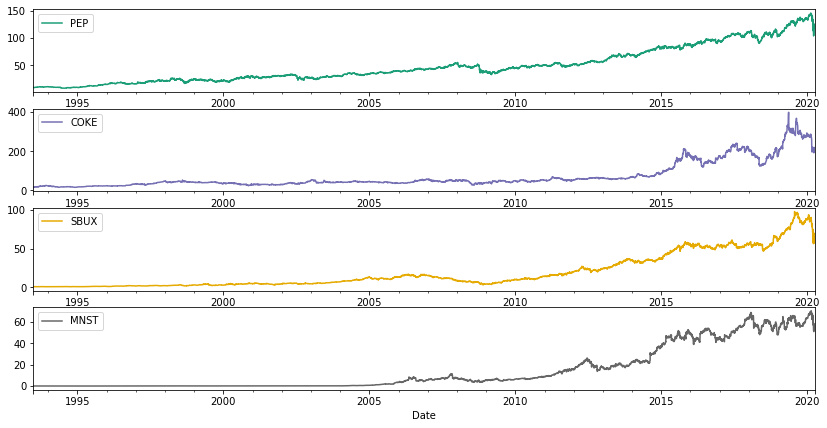

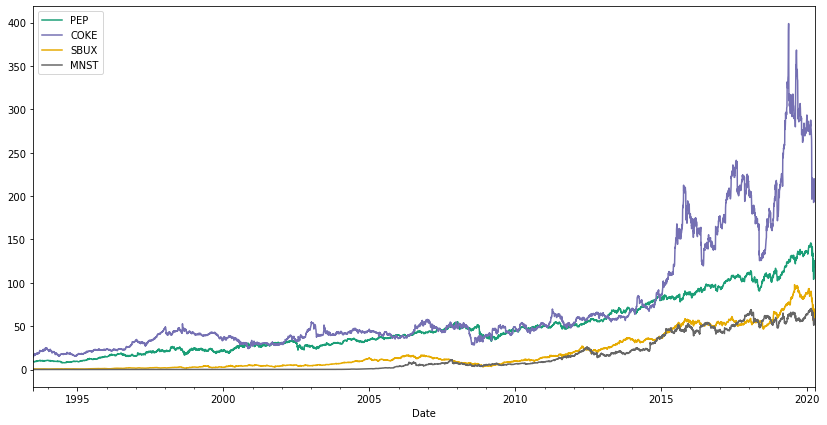

In [40]:
jts.plot_ts(ts)

## Splitting Data

In [41]:
splitDate = "2020-03-26"

train = ts[ts.index < splitDate]
test = ts[ts.index >= splitDate]
train

,PEP,COKE,SBUX,MNST
Date,,,,
1993-06-28,9.317060,14.530738,0.650095,0.067708
1993-06-29,9.380442,14.685318,0.636827,0.059896
1993-06-30,9.380442,14.839906,0.650095,0.059896
1993-07-01,9.285371,17.158636,0.656728,0.059896
1993-07-02,9.190292,16.385729,0.683263,0.059896
...,...,...,...,...
2020-03-21,104.346667,192.843338,57.536666,51.723333
2020-03-22,104.763334,193.116669,57.043332,51.346667
2020-03-23,105.180000,193.389999,56.549999,50.970001


In [42]:
test

,PEP,COKE,SBUX,MNST
Date,,,,
2020-03-26,120.260002,219.949997,69.900002,57.840000
2020-03-27,120.459999,201.119995,66.339996,56.389999
2020-03-28,122.133334,203.299998,66.846664,56.926666
2020-03-29,123.806669,205.480001,67.353333,57.463333
2020-03-30,125.480003,207.660004,67.860001,58.000000
2020-03-31,120.099998,208.529999,65.739998,56.259998
2020-04-01,118.120003,194.089996,62.619999,53.099998


## Differencing

### Seasonality

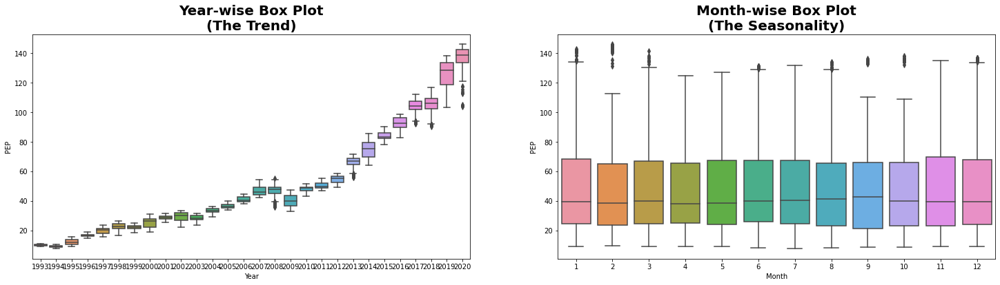

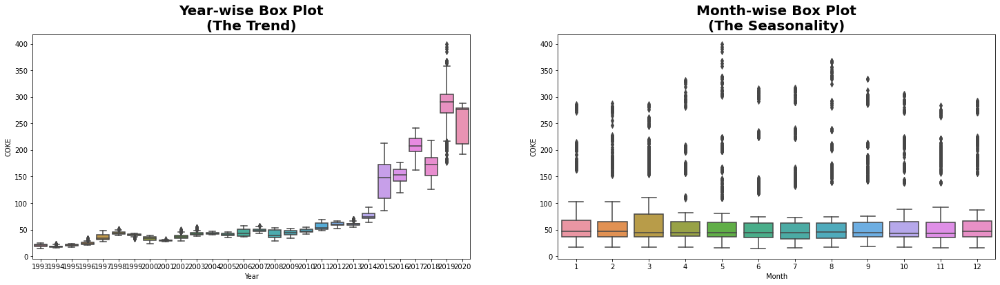

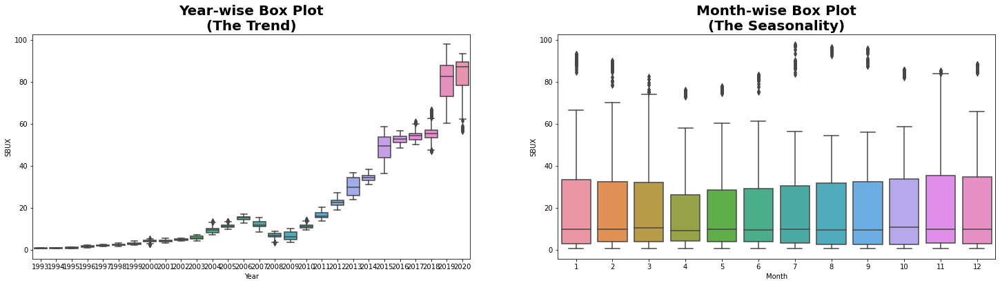

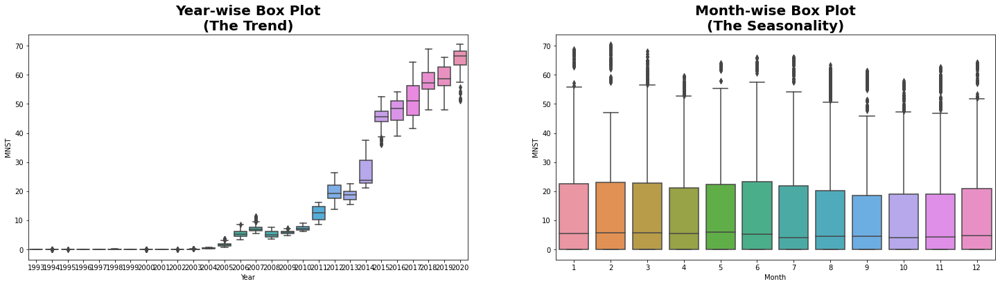

In [43]:
jts.draw_trend_and_seasonality_box_plots(train)

### Granger Causality Test

In [44]:
jts.grangers_causation_matrix(train, variables = train.columns)

,PEP_x,COKE_x,SBUX_x,MNST_x
PEP_y,1.0,0.0,0.0,0.0
COKE_y,0.0,1.0,0.0,0.0
SBUX_y,0.0,0.0,1.0,0.0
MNST_y,0.0,0.0,0.0,1.0


So we do not have a lot of causality here. The outputted table is p-values, and the column value impacts the row value. So this data makes it a very good canidate to use multivariate modeling

### Cointegration

So we are going to see if the time series are cointegrated, which means they have a long run, statistically significant relationship. Two or more time series seem to be cointegrated when there exists a linear combination fo them that has an order of integration less than that of the individual series, then the collection of series is said to be cointegrated.

In [45]:
jts.cointegration_test(train)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
PEP    ::  50.62     > 40.1749   =>   True
COKE   ::  27.12     > 24.2761   =>   True
SBUX   ::  6.83      > 12.3212   =>   False
MNST   ::  1.59      > 4.1296    =>   False


### Taking a Lagged Difference

Since our timeseries is obviously non-stationary, we will take a lagged difference.

$y_t^\prime = y_t - y_{t-1}$

In [46]:
# 1st difference
trainDiff = train.diff().dropna()

jts.mts_adf(trainDiff)

    Augmented Dickey-Fuller Test on "PEP" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -17.7099
 No. Lags Chosen       = 23
 Critical value 1%     = -3.431
 Critical value 5%     = -2.862
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "COKE" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -17.5708
 No. Lags Chosen       = 36
 Critical value 1%     = -3.431
 Critical value 5%     = -2.862
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "SBUX" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.

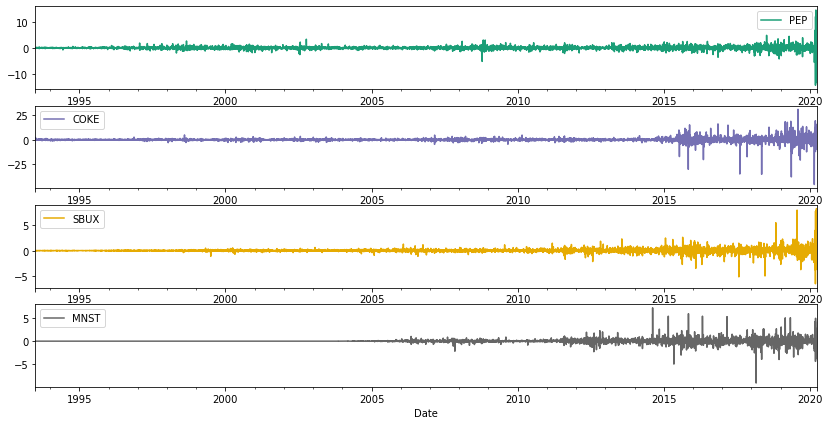

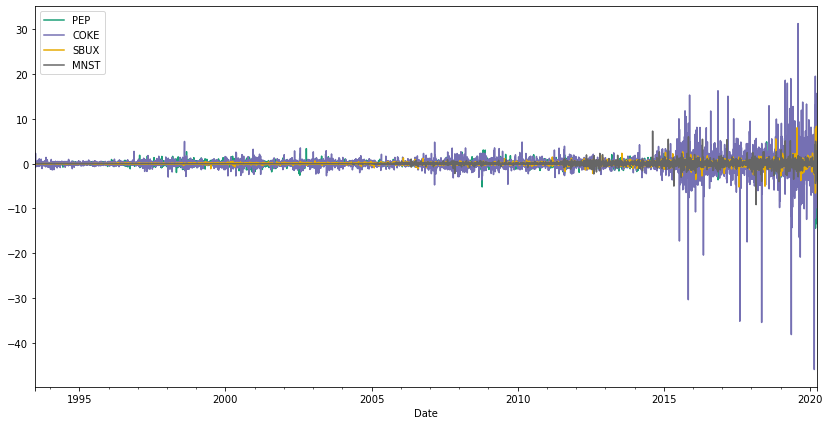

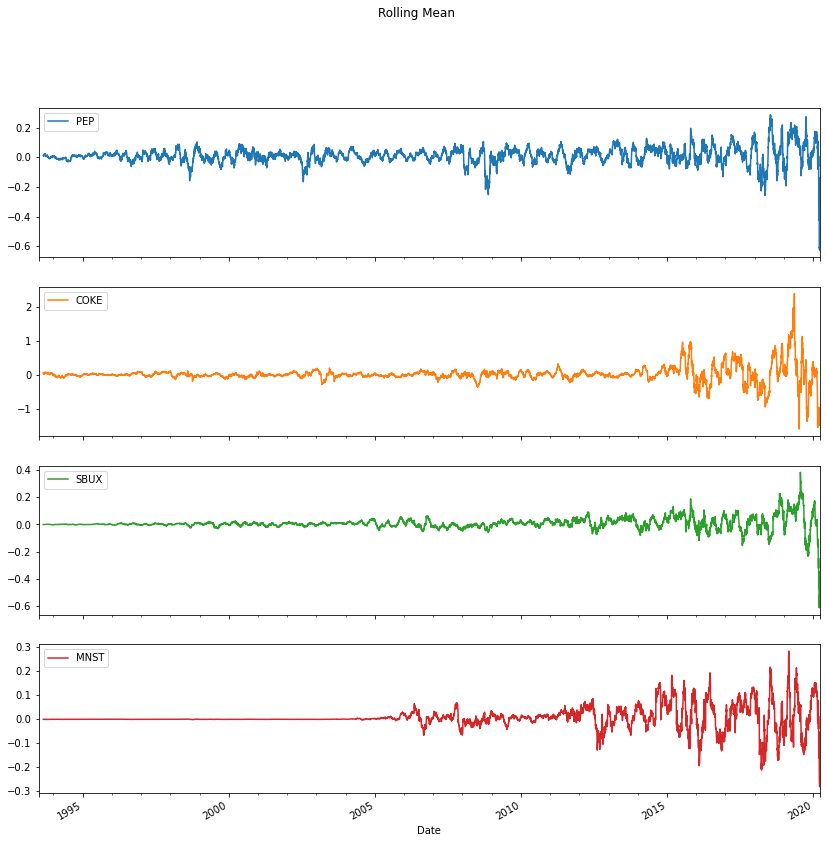

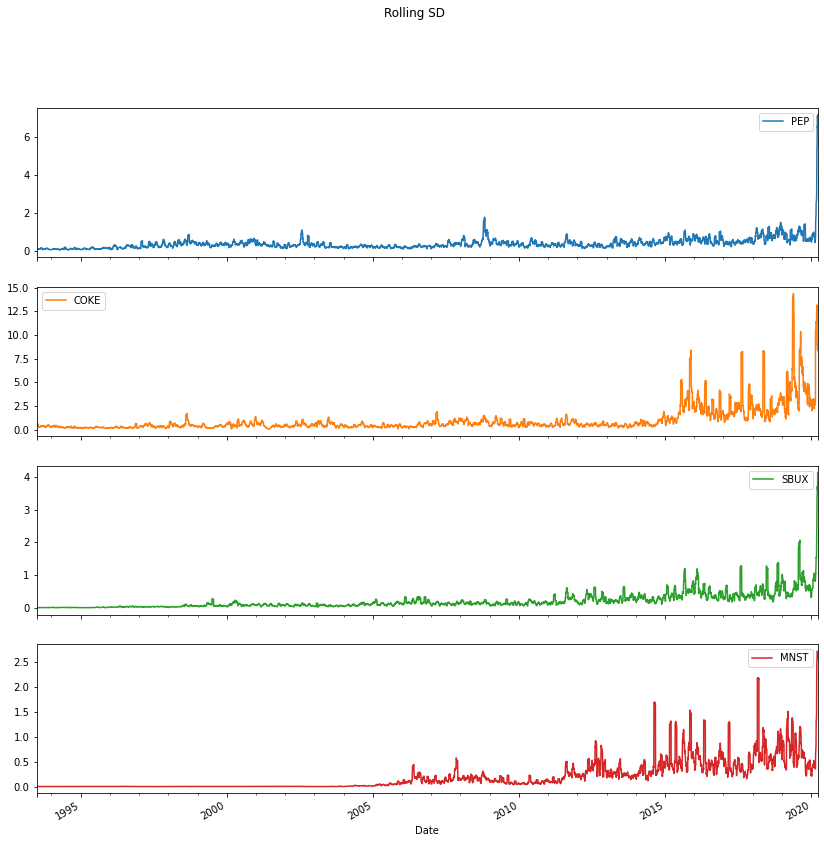

In [47]:
jts.plot_ts(trainDiff)

# Plots the rolling mean and std
jts.plot_rolling_mean_and_std(trainDiff)

### Taking a log then differencing

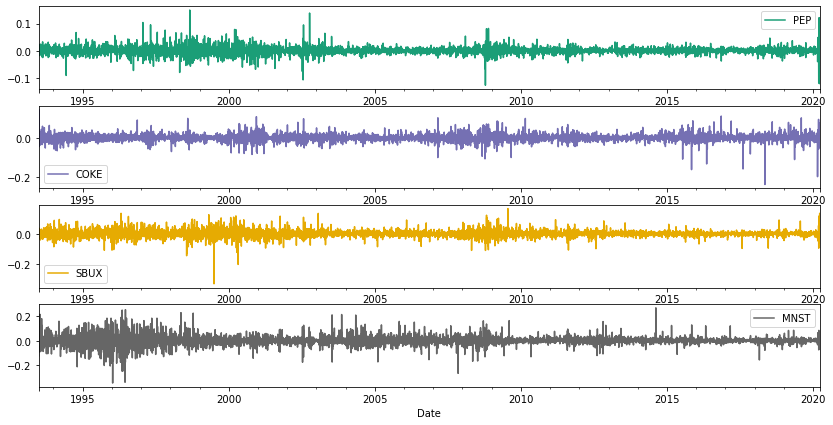

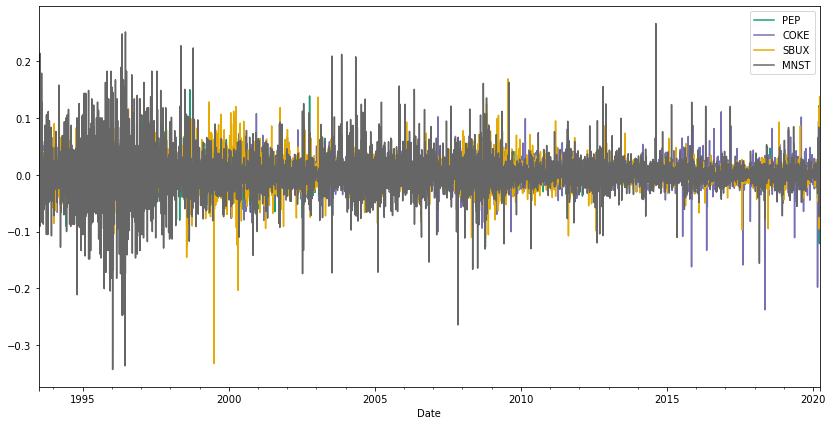

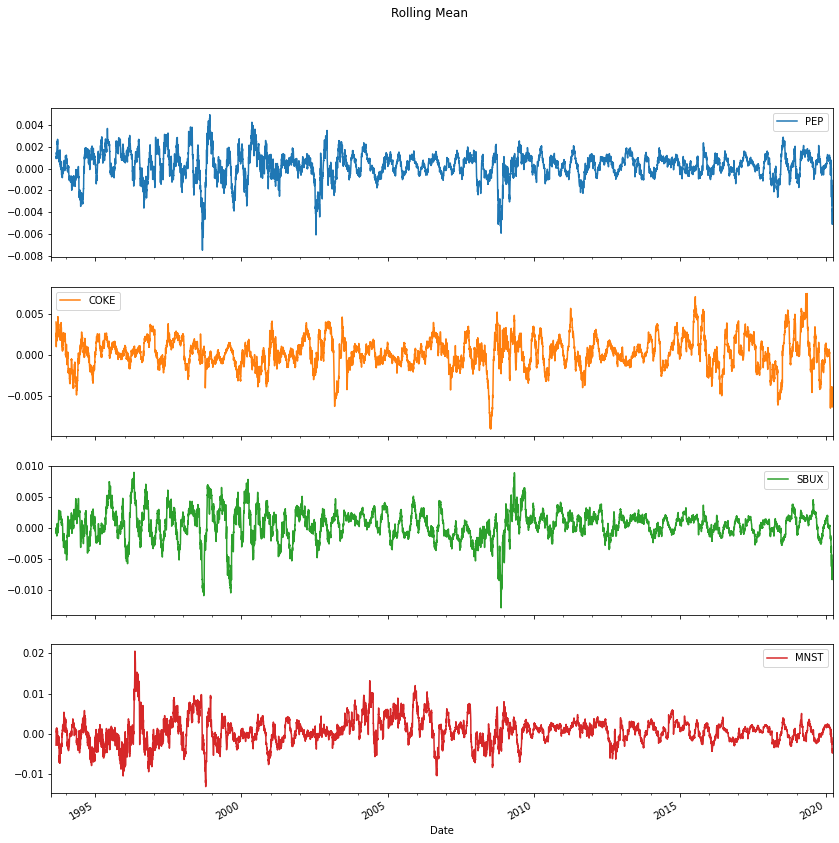

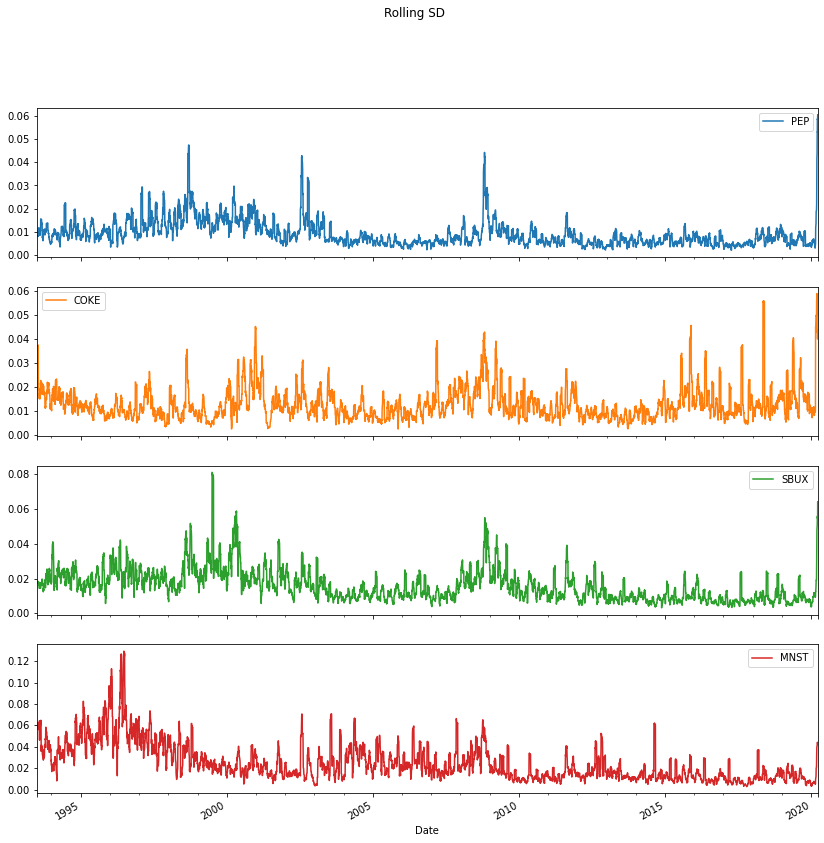

In [48]:
logTrain = np.log(train)
logTrainDiff = logTrain.diff().dropna()

jts.plot_ts(logTrainDiff)

# Plots the rolling mean and std
jts.plot_rolling_mean_and_std(logTrainDiff)

In [49]:
jts.mts_adf(logTrainDiff)

    Augmented Dickey-Fuller Test on "PEP" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -44.335
 No. Lags Chosen       = 5
 Critical value 1%     = -3.431
 Critical value 5%     = -2.862
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "COKE" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -27.2981
 No. Lags Chosen       = 12
 Critical value 1%     = -3.431
 Critical value 5%     = -2.862
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "SBUX" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05

## Order Selection

In [50]:
jts.var_order(logTrainDiff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -32.452615     -32.437897     -32.447627      91.783239     0.000000     
2        -32.451991     -32.425497     -32.443012      9.878682      0.872887     
3        -32.462609     -32.424336     -32.449638      119.432118    0.000000     
4        -32.462070     -32.412016     -32.445107      10.693233     0.828013     
5        -32.462365     -32.400529     -32.441409      18.815699     0.278336     
6        -32.461867     -32.388246     -32.436917      11.077827     0.804656     
7        -32.460669     -32.375261     -32.431724      4.256708      0.998386     
8        -32.459059     -32.361862     -32.426119      0.248635      1.000000     


    AIC  = 3
    BIC  = 1
    HQIC = 3


## Model Fitting

In [51]:
model = VAR(logTrainDiff)
fit = model.fit(1)
fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 19, Oct, 2020
Time:                     22:07:32
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                   -32.4379
Nobs:                     9766.00    HQIC:                  -32.4476
Log likelihood:           103057.    FPE:                8.05394e-15
AIC:                     -32.4526    Det(Omega_mle):     8.03747e-15
--------------------------------------------------------------------
Results for equation PEP
             coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------
const           0.000261         0.000114            2.296           0.022
L1.PEP          0.005203         0.010592            0.491           0.623
L1.COKE        -0.008632         0.007803           -1.106           0.269
L1.SBUX    

### Residual Checking

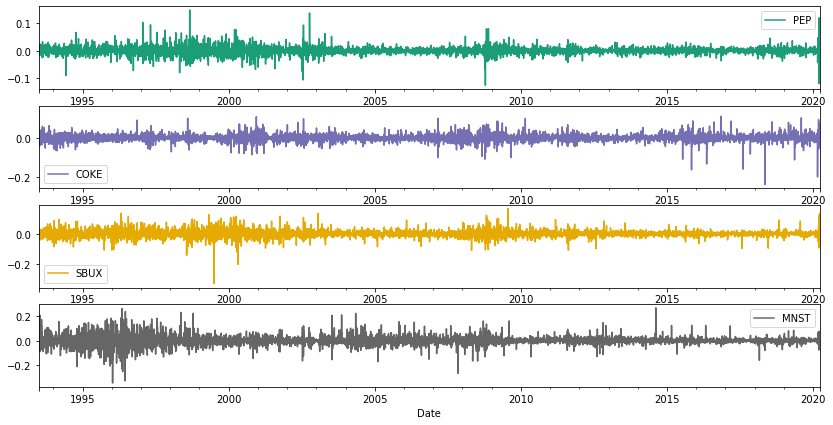

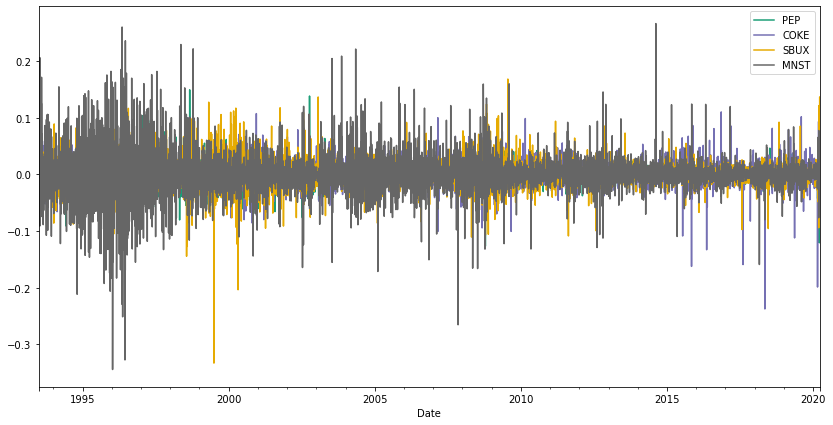

In [52]:
jts.plot_ts(fit.resid)

#### Durbin Watson Test
The value of this statistic can vary between 0 and 4. The closer it is to the value 2, then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, and the closer it is to 4 implies negative serial correlation.

In [53]:
jts.dw_test(fit, ts)

Durbin Watson Test
--------------------
PEP : 2.0
COKE : 2.0
SBUX : 2.0
MNST : 2.0


## Forecasting

In [54]:
nobs = 5
logPredictedDiffStats = jts.forecast(fit, logTrainDiff, test, nobs, calc_conf = True)
logPredictedDiffStats

,PEP_forecast,COKE_forecast,SBUX_forecast,MNST_forecast,PEP_upper,COKE_upper,SBUX_upper,MNST_upper,PEP_lower,COKE_lower,SBUX_lower,MNST_lower
Date,,,,,,,,,,,,
2020-03-28,-0.000595,-0.000859,0.000789,0.004546,0.021422,0.028507,0.037583,0.064269,-0.022613,-0.030224,-0.036004,-0.055177
2020-03-29,0.000253,0.000252,0.000464,0.000341,0.022276,0.029626,0.037268,0.060286,-0.021771,-0.029121,-0.036340,-0.059603
2020-03-30,0.000255,0.000279,0.000472,0.000724,0.022278,0.029652,0.037276,0.060670,-0.021768,-0.029095,-0.036332,-0.059222
2020-03-31,0.000254,0.000276,0.000475,0.000693,0.022277,0.029650,0.037279,0.060639,-0.021769,-0.029097,-0.036329,-0.059253
2020-04-01,0.000254,0.000276,0.000475,0.000696,0.022277,0.029650,0.037279,0.060642,-0.021769,-0.029097,-0.036329,-0.059251


In [55]:
logUpperDiff = logPredictedDiffStats[logPredictedDiffStats.columns[4:8]]
logLowerDiff = logPredictedDiffStats[logPredictedDiffStats.columns[8:12]]
logPredictedDiff = logPredictedDiffStats[logPredictedDiffStats.columns[0:4]]

logPred = jts.invert_diff_transformation(logPredictedDiff, logTrain)
pred = np.exp(logPred)
logUpper = jts.invert_diff_transformation(logUpperDiff, logTrain)
upper = np.exp(logUpper)
logLower = jts.invert_diff_transformation(logLowerDiff, logTrain)
lower = np.exp(logLower)
pred

,PEP_forecast,COKE_forecast,SBUX_forecast,MNST_forecast
Date,,,,
2020-03-28,112.433038,218.462316,65.861946,53.904489
2020-03-29,112.461434,218.517409,65.892531,53.922895
2020-03-30,112.490106,218.578312,65.923653,53.961968
2020-03-31,112.518711,218.638687,65.954991,53.999377
2020-04-01,112.547325,218.699114,65.986325,54.036956


In [56]:
upper

,PEP_upper,COKE_upper,SBUX_upper,MNST_upper
Date,,,,
2020-03-28,114.935987,224.972750,68.330373,57.221915
2020-03-29,117.524998,231.737440,70.924973,60.777696
2020-03-30,120.172617,238.711870,73.618680,64.579265
2020-03-31,122.879800,245.895592,76.414925,68.616468
2020-04-01,125.647970,253.295539,79.317357,72.906252


In [57]:
lower

,PEP_lower,COKE_lower,SBUX_lower,MNST_lower
Date,,,,
2020-03-28,109.984595,212.140285,63.482690,50.779390
2020-03-29,107.616033,206.051547,61.217164,47.841211
2020-03-30,105.298731,200.142868,59.032953,45.090231
2020-03-31,103.031258,194.403142,56.926849,42.496107
2020-04-01,100.812614,188.828050,54.895867,40.051333


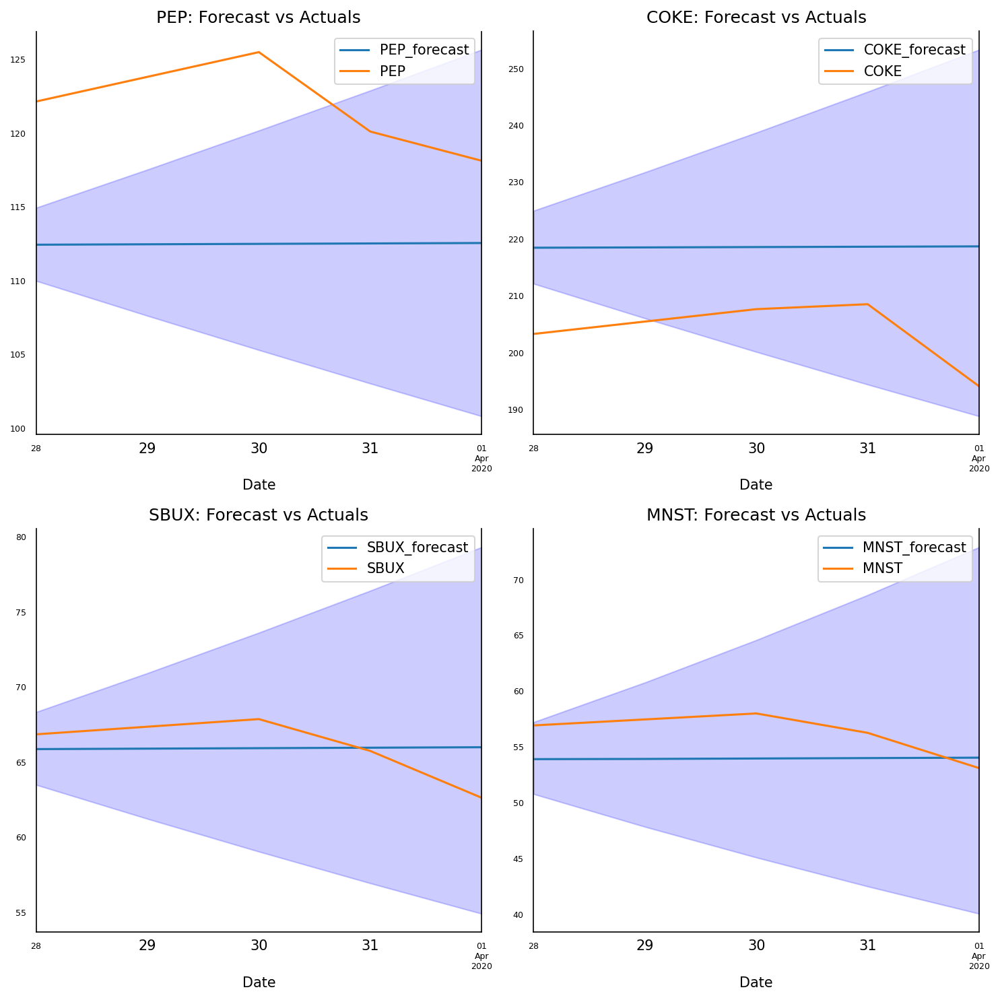

In [60]:
jts.plot_forecast_vs_actual(test, pred, upper, lower, nobs, True)

In [59]:
jts.forecast_accuracy(pred, test)

Results
----------------------------------------------------------------------
           ME            MSE            MAE            MAPE
PEP     -9.438         96.016         9.438          7.698%        
COKE    14.767         245.375        14.767         7.318%        
SBUX    -0.160         3.646          1.593          2.440%        
MNST    -2.385         8.792          2.760          4.843%        
